In [39]:
# 读取文件的基本信息和数据
import segyio
import numpy as np

def get_infos(filename):
    with segyio.open(filename, 'r') as segy_file:
        # 文件元数据
        print("File Format:", segy_file.format)
        print("Binary File Header:", segy_file.bin)
        print("Sorting Type:", segy_file.sorting)
    
        # 道头信息
        print("First Trace Header:", segy_file.header[1])
    
        # 地震数据
        print("First Trace Data:", segy_file.trace[0][:10])  
        
        ilines = segy_file.ilines
        xlines = segy_file.xlines
        samples = segy_file.samples

        print("Inline Data Shape:", segy_file.iline.shape)  # 按内线排序
        print("Xline Data Shape:", segy_file.xline.shape)  # 按交叉线排序

        data_cube = segyio.tools.cube(segy_file)
        print(data_cube.shape)
       

# 获取 trace 的数量
def get_traceinfos(filename):
    with segyio.open(filename, 'r') as segy_file:
        # 方法 1: 使用 segy_file.trace 的长度
        trace_count_method1 = len(segy_file.trace)
        print("Number of traces (Method 1):", trace_count_method1)
        
        # 方法 2: 使用 ilines 和 xlines
        if segy_file.sorting in [2, 4]:  # 检查是否按内线排序
            iline_count = len(segy_file.ilines)
            print("num of iline_count: ", iline_count)
            xline_count = len(segy_file.xlines)
            print("num of xline_count: ", xline_count)
            samples_per_trace = segy_file.samples

            # 如果是按内线排序，则每个内线上有相同的 trace 数量
            # 获取所有内线编号
            ilines = segy_file.ilines
            # 选择一个内线编号
            selected_iline = ilines[0]
            # 获取选定内线的数据
            iline_data = segy_file.iline[selected_iline]
    
            # 输出选定内线的数据形状
            print("Data shape of inline: ", selected_iline, ":", iline_data.shape)
            
            traces_per_iline = len(iline_data)
            print("traces_per_iline: ", traces_per_iline)
            
            # 总 trace 数量
            trace_count_method2 = iline_count * traces_per_iline
            print("Number of traces (Method 2): ", trace_count_method2)
        else:
            print("The file is not sorted by inline.")

# 计算采样间隔和持续时间
def get_interval_duration(filename):
    sampling_rate = 250  # 假设采样率为 250 Hz
    with segyio.open(filename, 'r') as segy_file:
        sample_count = segy_file.samples
        sample_interval = 1 / sampling_rate  # 采样间隔，单位为秒
        duration = sample_count * sample_interval  # 持续时间，单位为秒
        
        print("Number of samples per trace:", sample_count)
        print("Sampling interval:", sample_interval, "seconds")
        print("Duration of each trace:", duration, "seconds")


# 深度时间转换
def time_to_depth(time_data, velocity_model):
    # 假设时间数据和速度模型都是二维数组
    depth_data = time_data * velocity_model / 2  # 简化的时间深度转换公式
    return depth_data

def timeConvertTodeep(filename):
    with segyio.open(filename, 'r') as segy_file:
        time_data = segy_file.trace[0]  # 假设时间数据为一维数组
        velocity_model = np.ones_like(time_data) * 1500  # 假设平均速度为 1500 m/s

        depth_data = time_to_depth(time_data, velocity_model)
        depth = 1000  # 特定深度，单位为米
        depth_slice = depth_data[depth]  # 假设 depth_data 已经是一个三维数组
        
        print("Shape of the depth slice:", depth_slice.shape)
        print("Depth slice data:", depth_slice)


def nmo_correction():
    """
    对地震数据进行正常动校正 (NMO)。
    
    参数:
    - data: 地震数据，一维数组，表示一个地震道的时间序列。
    - velocity: 地下介质的速度，单位为 m/s。
    - offset: 震源到接收器的距离，单位为 m。
    
    返回:
    - 校正后的数据。
    """
    # 示例数据
    data = np.random.rand(100)  # 假设这是原始的地震道数据
    velocity = 1500  # 假设平均速度为 1500 m/s
    offset = 500  # 假设偏移距离为 500 m
    # 计算动校正量
    correction = (offset ** 2) / (2 * velocity ** 2)
    
    # 应用动校正
    corrected_data = np.zeros_like(data)
    for i, t in enumerate(data):
        corrected_time = t + correction
        if corrected_time < len(data):
            corrected_data[int(corrected_time)] = data[i]
    print("Original data shape:", data)
    print("Corrected data shape:", corrected_data)

def crop_data(filename):
    with segyio.open(filename, 'r') as src:
        cube_data = segyio.tools.cube(filename)
        # subsets_data = crop(cube_data)
        # print(cube_data.shape)
        # print(cube_data[100][200][300])
        # print(len(subsets_data))
        # print(subsets_data[0].shape)
        # print(subsets_data[0][20][30][40])
    (inlines, xlines, samples) = cube_data.shape
    (subset_inlines, subset_xlines, subset_samples) = (64, 64, samples)
    num_subsets_iline = inlines // subset_inlines
    num_subsets_xline = xlines // subset_xlines
    num_subsets_sample = samples // subset_samples
    # 循环遍历每个维度，分割子块
    subsets_data = []
    for i in range(num_subsets_iline):
        for j in range(num_subsets_xline):
            subset = cube_data[i * subset_inlines:(i + 1) * subset_inlines, j * subset_xlines:(j + 1) * subset_xlines, :]
            subsets_data.append(subset)
    return subsets_data
    

filename = "Stack_final.sgy"
# get_infos(filename)
get_traceinfos(filename)
# get_interval_duration(filename)
# timeConvertTodeep(filename)
# nmo_correction()
# t1 = crop_data(filename)

Number of traces (Method 1): 124070
num of iline_count:  95
num of xline_count:  1306
Data shape of inline:  1 : (1306, 1300)
traces_per_iline:  1306
Number of traces (Method 2):  124070


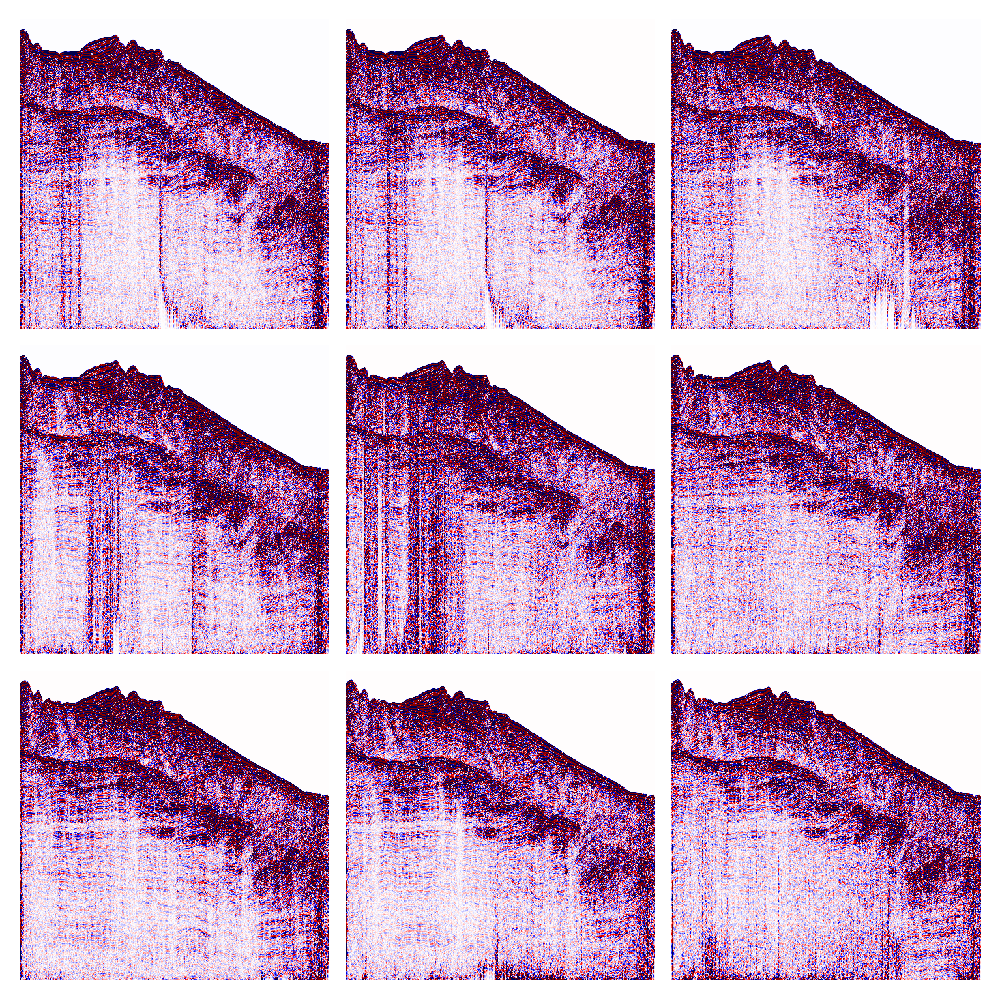

In [48]:
figsize = np.array([10, 10]) * 0.5
dpi = 300
fig, axs = plt.subplots(3, 3, figsize=figsize, dpi=dpi, constrained_layout=True)
with segyio.open(filename, 'r') as segy_file:
    data = segy_file.iline[1]
    vlim = max(abs(np.max(data)), abs(np.min(data))) / 100
    for i0, axi in enumerate(axs.flatten()):
        # print(segy_file.iline[i0 + 1].T.shape)
        axi.imshow(segy_file.iline[i0 + 1].T, cmap=plt.cm.seismic, vmax=vlim, vmin=-vlim, aspect="auto")
        axi.axis('off')


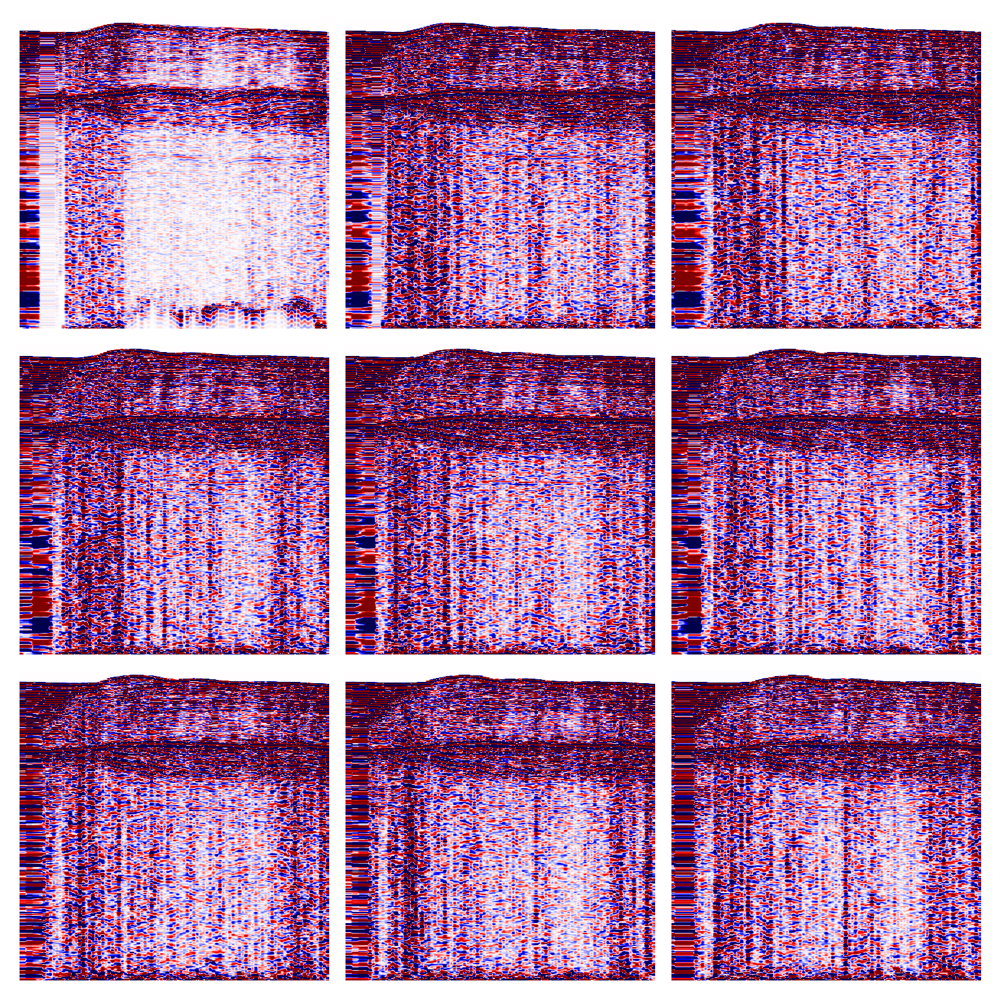

In [61]:
figsize = np.array([10, 10]) * 0.5
dpi = 300
fig, axs = plt.subplots(3, 3, figsize=figsize, dpi=dpi, constrained_layout=True)
with segyio.open(filename, 'r', iline=189, xline=193) as segy_file:
    data = segy_file.iline[1]
    vlim = max(abs(np.max(data)), abs(np.min(data))) / 100
    for i0, axi in enumerate(axs.flatten()):
        # print(segy_file.xline[i0 + 1].T.shape)
        axi.imshow(segy_file.xline[i0 + 1].T, cmap=plt.cm.seismic, vmax=vlim, vmin=-vlim, aspect="auto")
        axi.axis('off')


(95, 1306, 1300)


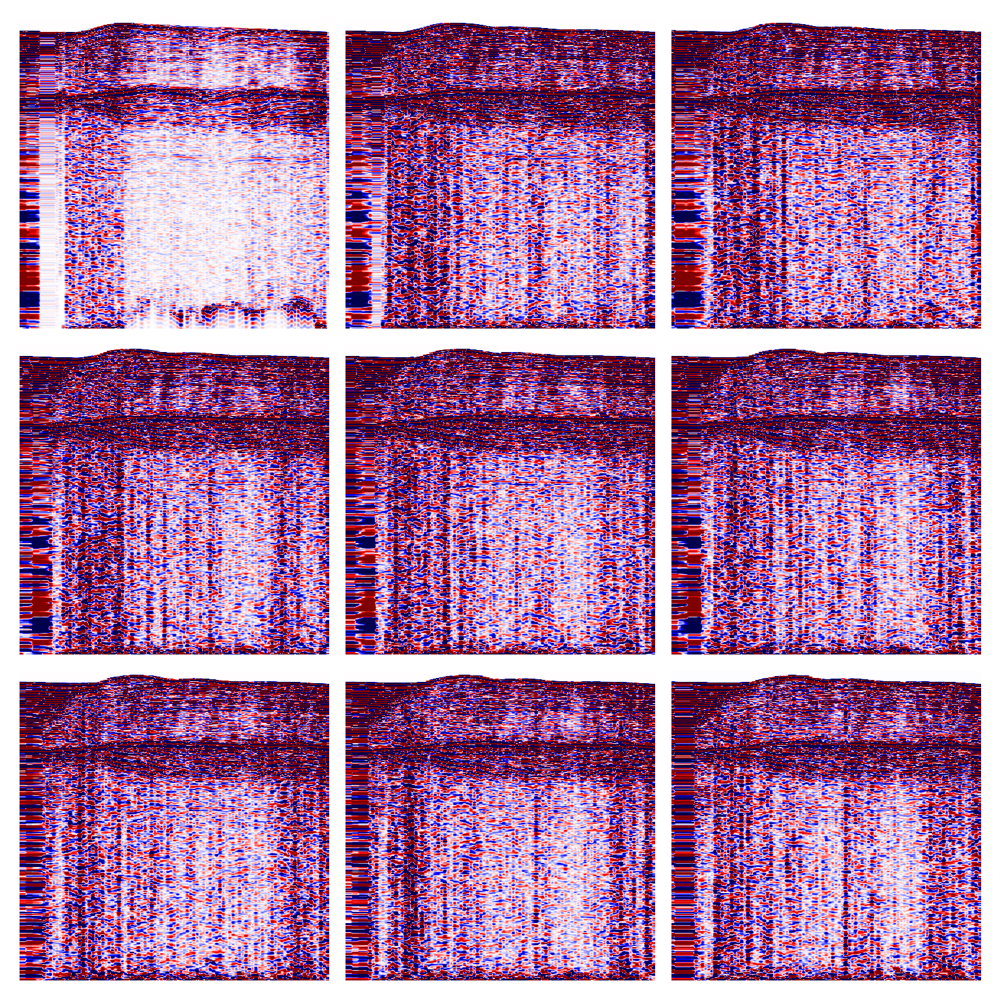

In [62]:
# figsize = np.array([10, 10]) * 0.5
# dpi = 300
# fig, axs = plt.subplots(3, 3, figsize=figsize, dpi=dpi, constrained_layout=True)
datas = []
with segyio.open(filename, 'r', iline=189, xline=193) as segy_file:
    for i in range(segy_file.tracecount):
        datas.append(segy_file.trace[i])
    iline_count = len(segy_file.ilines)
    xline_count = len(segy_file.xlines)
    datas = np.array(datas).reshape(iline_count, xline_count, -1)
    # datas = np.array(datas).reshape(xline_count, iline_count, -1)
print(datas.shape) 

figsize = np.array([10, 10]) * 0.5
dpi = 300
fig, axs = plt.subplots(3, 3, figsize=figsize, dpi=dpi, constrained_layout=True)
vlim = max(abs(np.max(datas[0])), abs(np.min(datas[0]))) / 100
for i0, axi in enumerate(axs.flatten()):
    # print(segy_file.xline[i0 + 1].T.shape)
    axi.imshow(datas[:, i0, :].T, cmap=plt.cm.seismic, vmax=vlim, vmin=-vlim, aspect="auto")
    axi.axis('off')
